# Preliminary Analysis if potential dataset to use

All the data are stored inside the *data_small* directory which contains a partial version of the original data (so that it can be uploaded on GitHub) 




**Resource**
https://opendatascience.com/show-me-the-data-8-awesome-time-series-sources/


In [3]:
import pandas as pd
import os,sys
import numpy as np


# Baltimora Crime records  -> No, ONLY CATEGORICAL

https://data.world/data-society/city-of-baltimore-crime-data

**DESCRIPTION**: City of Baltimore Crime Data from 2011-2016

**SUMMARY**: This data includes 286k rows and 12 columns as:

- Date and time
- Location detailed to coordinates
- Description of crime type

Source: City of Baltimore Open Data (updated monthly)

In [4]:
df = pd.read_csv('data_small/Part_1_Crime_Data_10000.csv' )

In [6]:
df.columns

Index(['X', 'Y', 'RowID', 'CCNumber', 'CrimeDateTime', 'CrimeCode',
       'Description', 'Inside_Outside', 'Weapon', 'Post', 'Gender', 'Age',
       'Race', 'Ethnicity', 'Location', 'Old_District', 'New_District',
       'Neighborhood', 'Latitude', 'Longitude', 'GeoLocation', 'PremiseType',
       'Total_Incidents'],
      dtype='object')

In [7]:
df.head()

,X,Y,RowID,CCNumber,CrimeDateTime,CrimeCode,Description,Inside_Outside,Weapon,Post,...,Ethnicity,Location,Old_District,New_District,Neighborhood,Latitude,Longitude,GeoLocation,PremiseType,Total_Incidents
0,-76.572136,39.299299,1,22B07631,2022/02/26 04:00:00+00,5B,BURGLARY,NaN,NaN,334.0,...,NaN,3200 E MONUMENT ST,EASTERN,NaN,ORANGEVILLE INDUSTRIAL AREA,39.299299,-76.572136,"(39.299298999999998,-76.572136)",NaN,1
1,-76.577016,39.284135,2,22B07176,2022/02/26 07:24:00+00,6C,LARCENY,NaN,NaN,214.0,...,NaN,2800 FOSTER AVE,SOUTHEAST,NaN,CANTON,39.284135,-76.577016,"(39.284134999999999,-76.577016)",NaN,1
2,-76.644308,39.271358,3,22B07181,2022/02/26 05:40:00+00,5F,BURGLARY,NaN,NaN,941.0,...,NaN,1300 WESTERN AVE,SOUTHERN,NaN,CARROLL - CAMDEN INDUSTRIAL AREA,39.271358,-76.644308,"(39.271357999999999,-76.644307999999995)",NaN,1
3,-76.560956,39.308166,4,22B07215,2022/02/26 11:25:00+00,3CF,ROBBERY - COMMERCIAL,NaN,FIREARM,433.0,...,NaN,4700 ERDMAN AVE,NORTHEAST,NaN,ARMISTEAD GARDENS,39.308166,-76.560956,"(39.308166,-76.560956000000004)",NaN,1
4,-76.544464,39.371811,5,22B07329,2022/02/26 00:25:00+00,5F,BURGLARY,NaN,NaN,424.0,...,NaN,7600 HARFORD RD,NORTHEAST,NaN,NORTH HARFORD ROAD,39.371811,-76.544464,"(39.371811000000001,-76.544464000000005)",NaN,1


In [24]:
import h5py as h5

def read_f(file):
    f = h5.File(file, 'r')
    
    dt = f['observations_table']['date_time'][:]
    z = f['observations_table']['z_coordinate'][:]
    z_type = f['observations_table']['z_coordinate_type'][:]
    var = f['observations_table']['observed_variable'][:]
    val = f['observations_table']['observation_value'][:]
    
    #print(oid[:10] )
    dt = pd.to_datetime( dt, unit='s',  origin=pd.Timestamp('1900-01-01') )
    
    df = pd.DataFrame( { 'date_time':dt, 
                        'z_coordinate': z , 
                        'z_coordinate_type' : z_type , 
                        'observed_variable': var,
                        'observation_value': val,
                       
                       } 
                     
                     
                     )
    df =df.loc[df.z_coordinate_type ==1 ]
    
    df = df.drop_duplicates ( subset = ['date_time','z_coordinate','observed_variable'])
    df = df[df.z_coordinate.isin([100000,85000,50000,10000])]
    df = df[df.observed_variable.isin([126,105,106,107,108]) ]

    return df

In [32]:
### Create TEMP time-series data (Univie srv)

file_lindenberg = '/scratch/das/federico/COP2_HARVEST_JAN2023/igra2/0-20001-0-10393_igra2_harvested_GMM00010393-data.txt.nc'
df = read_f(file_lindenberg)

df.to_csv('data_small/lindenberg_red.csv' , sep = '\t')

In [26]:
len(df)

1021536

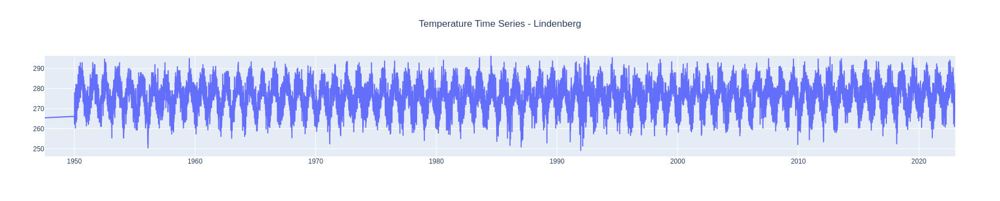

In [29]:
import plotly.graph_objects as go


df_r = df.loc[ (df.z_coordinate == 85000) & (df.observed_variable == 126) ]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x= df_r.date_time,
    y= df_r.observation_value ,
    connectgaps=True # override default to connect the gaps
))


fig.update_layout(
    title={
        'text': "Temperature Time Series - Lindenberg",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

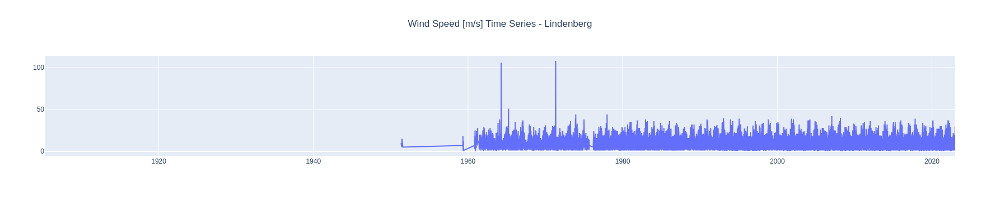

In [31]:
import plotly.graph_objects as go


df_r = df.loc[ (df.z_coordinate == 85000) & (df.observed_variable == 107) ]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x= df_r.date_time,
    y= df_r.observation_value ,
    connectgaps=True # override default to connect the gaps
))


fig.update_layout(
    title={
        'text': "Wind Speed [m/s] Time Series - Lindenberg",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()